# 0.0 Imports

In [73]:
import pandas as pd
import numpy as np
import seaborn as sns
import inflection 
import plotly.express as px
import umap as umap
import re
import sweetviz as sv

from matplotlib import pyplot as plt
from IPython.display import HTML
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
from sklearn import metrics
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from ydata_profiling import ProfileReport
from sklearn import decomposition as dd
from sklearn.manifold import TSNE
from sklearn.ensemble import RandomForestRegressor
from sklearn.mixture import GaussianMixture
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster import hierarchy as hc
from sklearn.cluster import DBSCAN, AffinityPropagation


In [2]:
%matplotlib inline

## 0.1 Helper Functions

### Set Display

In [3]:
def notebook_settings():
    plt.style.use( 'ggplot' )
    plt.rcParams['figure.figsize'] = [24, 9]
    plt.rcParams['font.size'] = 24

    display(HTML('<style>.container {width:100% !important;}</style>'))
    pd.options.display.max_columns=None
    pd.options.display.max_rows=None
    pd.set_option( 'display.expand_frame_repr', False)

    sns.set()
notebook_settings()

In [818]:
# supress scientific notation
# pd.set_option('display.float_format', lambda x: '%.3f' % x)

## 0.2 Load Data

In [4]:
# data = pd.read_csv('../data/raw/data.csv', encoding='unicode_escape'
data = pd.read_excel('../data/raw/Online Retail.xlsx')

In [820]:
# data = pd.read_csv('../data/raw/Ecommerce.csv', encoding='unicode_escape')
# data = data.drop( columns=['Unnamed: 8'], axis=1 )

# Planification (IoT)

# 1.0 Data Description

### 1.1 Data Dimensions

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    541909 non-null  object        
 1   StockCode    541909 non-null  object        
 2   Description  540455 non-null  object        
 3   Quantity     541909 non-null  int64         
 4   InvoiceDate  541909 non-null  datetime64[ns]
 5   UnitPrice    541909 non-null  float64       
 6   CustomerID   406829 non-null  float64       
 7   Country      541909 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(4)
memory usage: 33.1+ MB


In [6]:
data.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom


### 1.2 Rename Columns

In [7]:
cols_old = ['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country']

snakecase = lambda x: inflection.underscore( x ) # change to snakecase
cols_new = list( map( snakecase, cols_old ))

data.columns = cols_new # define the new columns

### 1.3 Check and fillout Nan

In [8]:
# check Na
data.isna().sum()

invoice_no           0
stock_code           0
description       1454
quantity             0
invoice_date         0
unit_price           0
customer_id     135080
country              0
dtype: int64

In [9]:
# replace NA
df_missing = data[data['customer_id'].isna()]
df_not_missing = data[~data['customer_id'].isna()]
print(f'Missing: {df_missing.shape[0]}')
print(f'Not Missing: {df_not_missing.shape[0]}')

Missing: 135080
Not Missing: 406829


In [10]:
# create reference
backup = pd.DataFrame(df_missing['invoice_no'].drop_duplicates())
backup['customer_id'] = np.arange(19000, 19000+len(backup), 1)

# merge original data frame
df1 = pd.merge(data, backup, on='invoice_no', how='left')

#coalesce
df1['customer_id'] = df1['customer_id_x'].combine_first(df1['customer_id_y'])

# drop columns
df1 = df1.drop(columns=['customer_id_x', 'customer_id_y'], axis=1)

In [11]:
df1.isna().sum()

invoice_no         0
stock_code         0
description     1454
quantity           0
invoice_date       0
unit_price         0
country            0
customer_id        0
dtype: int64

### 1.4 Change dtypes

In [12]:
# invoice data to datetime
df1['invoice_date'] = pd.to_datetime(df1['invoice_date'], format='%d-%b-%y')
#df1['invoice_date'] = df1['invoice_date'].dt.date

# customer id
df1['customer_id'] = df1['customer_id'].astype(int)

### 1.9 Descriptive Statistics

In [13]:
num_att = df1.select_dtypes(include=['int64', 'float64'])
cat_att = df1.select_dtypes( exclude=['int64', 'float64', 'datetime64[ns]'])

#### Numerical

In [14]:
# central tendency - mean and median
mean = pd.DataFrame(num_att.apply( np.mean )).T
median = pd.DataFrame(num_att.apply( np.median )).T

# dispertion - std, min, max, range, skew, kurtosis
std = pd.DataFrame(num_att.apply( np.std )).T
min_ = pd.DataFrame(num_att.apply( np.min )).T
max_ = pd.DataFrame(num_att.apply( np. max )).T
range_ = pd.DataFrame(num_att.apply( lambda x: x.max() - x.min())).T
skew = pd.DataFrame(num_att.apply( lambda x: x.skew())).T
kurtosis = pd.DataFrame(num_att.apply( lambda x: x.kurtosis())).T

# concatenate
description = pd.concat([mean, median, std, min_, max_, range_, skew, kurtosis]).T.reset_index()
description.columns = ['index', 'mean', 'median', 'std', 'min', 'max', 'range', 'skew', 'kurtosis']


In [15]:
description

,index,mean,median,std,min,max,range,skew,kurtosis
0,quantity,9.552250,3.00,218.080957,-80995.00,80995.0,161990.00,-0.264076,119769.160031
1,unit_price,4.611114,2.08,96.759764,-11062.06,38970.0,50032.06,186.506972,59005.719097
2,customer_id,16688.840453,16249.00,2911.408666,12346.00,22709.0,10363.00,0.487449,-0.804287


#### Categorical

In [19]:
# problema: Temos invoice com letras e numeros

df1['invoice_no'] = df1['invoice_no'].astype(str)  # Convert to string if not already

df_letter_invoices = df1.loc[df1['invoice_no'].apply(lambda x: bool(re.search('[^0-9]+', x))), :]

df_letter_invoices.head()

,invoice_no,stock_code,description,quantity,invoice_date,unit_price,country,customer_id
141,C536379,D,Discount,-1,2010-12-01 09:41:00,27.50,United Kingdom,14527
154,C536383,35004C,SET OF 3 COLOURED FLYING DUCKS,-1,2010-12-01 09:49:00,4.65,United Kingdom,15311
235,C536391,22556,PLASTERS IN TIN CIRCUS PARADE,-12,2010-12-01 10:24:00,1.65,United Kingdom,17548
236,C536391,21984,PACK OF 12 PINK PAISLEY TISSUES,-24,2010-12-01 10:24:00,0.29,United Kingdom,17548
237,C536391,21983,PACK OF 12 BLUE PAISLEY TISSUES,-24,2010-12-01 10:24:00,0.29,United Kingdom,17548


In [21]:
print(f'Nº of invoice with a letter: {df_letter_invoices.shape[0]}')
print(f'Nº of quantity < 0: {df1[df1["quantity"] < 0].shape[0]}')

Nº of invoice with a letter: 9291
Nº of quantity < 0: 10624


In [26]:
# Stock code

# Action
# remove stock_code in ['POST', 'D', 'M', 'PADS', 'DOT', 'CRUK']

df1['stock_code'] = df1['stock_code'].astype(str)  # Convert to string if not already

unique_alpha_stock_codes = df1.loc[df1['stock_code'].apply(lambda x: bool(re.search('^[a-zA-Z]+$', x))), 'stock_code'].unique()

In [25]:
unique_alpha_stock_codes

array(['POST', 'D', 'DOT', 'M', 'S', 'AMAZONFEE', 'm', 'DCGSSBOY',
       'DCGSSGIRL', 'PADS', 'B', 'CRUK'], dtype=object)

In [27]:
# Country

# nº invoice_no by country
by_country = df1[['invoice_no', 'country']].groupby('country').count().reset_index()
by_country['%'] = by_country['invoice_no'].apply( lambda x: 100 * (x / df1.shape[0]))
by_country.sort_values('invoice_no', ascending=False).head()

,country,invoice_no,%
36,United Kingdom,495478,91.431956
14,Germany,9495,1.752139
13,France,8557,1.579047
10,EIRE,8196,1.512431
31,Spain,2533,0.467422


In [28]:
# total revenue by country
rev = df1[['quantity', 'unit_price', 'country']].copy()
rev['total'] = rev['quantity'] * rev['unit_price']

rev_by_country = rev[['country', 'total']].groupby('country').sum().reset_index()
rev_by_country['%'] = rev_by_country['total'].apply(lambda x: 100 * (x/sum(rev_by_country['total']))) 
rev_by_country.sort_values('total', ascending=False).head()

,country,total,%
36,United Kingdom,8187806.364,83.996903
24,Netherlands,284661.540,2.920280
10,EIRE,263276.820,2.700899
14,Germany,221698.210,2.274353
13,France,197403.900,2.025123


In [ ]:
# customers by country
customer_by_contry = df1[['customer_id', 'country']].drop_duplicates().groupby('country').count().sort_values('customer_id', ascending=False).reset_index()
customer_by_contry['%'] = customer_by_contry['customer_id'].apply( lambda x: 100 * (x/sum(customer_by_contry['customer_id'])))
customer_by_contry.head()

,country,customer_id,%
0,United Kingdom,7587,93.782
1,Germany,95,1.174
2,France,90,1.112
3,EIRE,44,0.544
4,Spain,31,0.383


# 2.0 Filtragem de variáveis

In [29]:
df2 = df1.copy()

In [30]:
# unit price > 0.04
df2 = df2.loc[df2['unit_price'] >= 0.04, :]

# stock code 
df2 = df2[~df2['stock_code'].isin(['POST', 'D', 'DOT', 'M', 'S', 'AMAZONFEE', 'm', 'DCGSSBOY', 'DCGSSGIRL','PADS', 'B', 'CRUK'])]

# description
df2 = df2.drop(columns='description', axis=1)

#map
df2 = df2[~df2['country'].isin(['European Community', 'Unspecified'])]

# bad users
df2 = df2[~df2['customer_id'].isin([16446])]

# quantity - negative numbers means product returns
df2_returns = df2.loc[df2['quantity'] < 0, :]
df2_purchases = df2.loc[df2['quantity'] >= 0, :]

# 3.0 Feature Engineering

In [31]:
# date reference 
df_ref = df2_purchases.drop(['invoice_no', 'stock_code',
                   'quantity', 'invoice_date', 'unit_price', 
                   'country'], axis=1).drop_duplicates(ignore_index=True)

In [32]:
df_ref.shape

(5695, 1)

### 3.1 Features

In [33]:
# Gross Revenue ( Faturamento ) quantity * price
df2_purchases.loc[:, 'gross_revenue'] = df2_purchases.loc[:, 'quantity'] * df2_purchases.loc[:, 'unit_price']

# Monetary
df_monetary = df2_purchases.loc[:, ['customer_id', 'gross_revenue']].groupby( 'customer_id' ).sum().reset_index()
df_ref = pd.merge( df_ref, df_monetary, on='customer_id', how='left' )
df_ref.isna().sum()

/tmp/ipykernel_128382/206990356.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2_purchases.loc[:, 'gross_revenue'] = df2_purchases.loc[:, 'quantity'] * df2_purchases.loc[:, 'unit_price']


customer_id      0
gross_revenue    0
dtype: int64

In [34]:
# Recency - Last day purchase
df_recency = df2_purchases.loc[:, ['customer_id', 'invoice_date']].groupby( 'customer_id' ).max().reset_index()
df_recency['recency_days'] = ( df2['invoice_date'].max() - df_recency['invoice_date'] ).dt.days
df_recency['recency_days'] = df_recency['recency_days'].apply( lambda x: 1/x if x !=0 else 1)
df_recency = df_recency[['customer_id', 'recency_days']].copy()
df_ref = pd.merge( df_ref, df_recency, on='customer_id', how='left' )
df_ref.isna().sum()

customer_id      0
gross_revenue    0
recency_days     0
dtype: int64

In [35]:
# qtde_invoices
df_freq = (df2_purchases.loc[:, ['customer_id', 'invoice_no']].drop_duplicates()
                                                             .groupby( 'customer_id' )
                                                             .count()
                                                             .reset_index()
                                                             .rename( columns={'invoice_no': 'qtde_invoices'}) )
df_ref = pd.merge( df_ref, df_freq, on='customer_id', how='left' )
df_ref.isna().sum()

customer_id      0
gross_revenue    0
recency_days     0
qtde_invoices    0
dtype: int64

In [36]:
# qtde_items
df_freq = (df2_purchases.loc[:, ['customer_id', 'quantity']].groupby( 'customer_id' ).sum()
                                                           .reset_index()
                                                           .rename( columns={'quantity': 'qtde_items'} ) )
df_ref = pd.merge( df_ref, df_freq, on='customer_id', how='left' )
df_ref.isna().sum()

customer_id      0
gross_revenue    0
recency_days     0
qtde_invoices    0
qtde_items       0
dtype: int64

In [37]:
# Numero de produtos
df_freq = (df2_purchases.loc[:, ['customer_id', 'stock_code']].groupby( 'customer_id' ).count()
                                                           .reset_index()
                                                           .rename( columns={'stock_code': 'qtde_products'} ) )
df_ref = pd.merge( df_ref, df_freq, on='customer_id', how='left' )
df_ref.isna().sum()

customer_id      0
gross_revenue    0
recency_days     0
qtde_invoices    0
qtde_items       0
qtde_products    0
dtype: int64

In [38]:
# Avg Ticket
df_avg_ticket = df2_purchases.loc[:, ['customer_id', 'gross_revenue']].groupby( 'customer_id' ).mean().reset_index().rename( columns={'gross_revenue':'avg_ticket'} )
df_ref = pd.merge( df_ref, df_avg_ticket, on='customer_id', how='left')
df_ref.isna().sum()

customer_id      0
gross_revenue    0
recency_days     0
qtde_invoices    0
qtde_items       0
qtde_products    0
avg_ticket       0
dtype: int64

In [39]:
# Average recency days
df_aux = df2[['customer_id', 'invoice_date']].drop_duplicates().sort_values( ['customer_id', 'invoice_date'], ascending= False )
df_aux['next_customer_id'] = df_aux['customer_id'].shift() # next customer
df_aux['previous_date'] = df_aux['invoice_date'].shift() # next invoince date

df_aux['avg_recency_days'] = df_aux.apply( lambda x: ( x['previous_date'] - x['invoice_date'] ).days if x['customer_id'] == x['next_customer_id'] else 0, axis=1 )
df_aux['avg_recency_days'] = -1* df_aux['avg_recency_days'].apply( lambda x: 1/x if x!=0 else 1)

df_aux = df_aux.drop( ['invoice_date', 'next_customer_id', 'previous_date'], axis=1 ).dropna()

# average recency 
df_avg_recency_days = df_aux.groupby( 'customer_id' ).mean().reset_index()

# merge
df_ref = pd.merge( df_ref, df_avg_recency_days, on='customer_id', how='left' )
df_ref.isna().sum()

customer_id         0
gross_revenue       0
recency_days        0
qtde_invoices       0
qtde_items          0
qtde_products       0
avg_ticket          0
avg_recency_days    0
dtype: int64

In [40]:
# frquency
df_aux = ( df2_purchases[['customer_id', 'invoice_no', 'invoice_date']].drop_duplicates()
                                                             .groupby( 'customer_id')
                                                             .agg( max_ = ( 'invoice_date', 'max' ), 
                                                                   min_ = ( 'invoice_date', 'min' ),
                                                                   days_= ( 'invoice_date', lambda x: ( ( x.max() - x.min() ).days ) + 1 ),
                                                                   buy_ = ( 'invoice_no', 'count' ) ) ).reset_index()
# Frequency
df_aux['frequency'] = df_aux[['buy_', 'days_']].apply( lambda x: x['buy_'] / x['days_'] if  x['days_'] != 0 else 0, axis=1 )

# Merge
df_ref = pd.merge( df_ref, df_aux[['customer_id', 'frequency']], on='customer_id', how='left' )

df_ref.isna().sum()

customer_id         0
gross_revenue       0
recency_days        0
qtde_invoices       0
qtde_items          0
qtde_products       0
avg_ticket          0
avg_recency_days    0
frequency           0
dtype: int64

In [41]:
# Number of Returns
df_returns = df2_returns[['customer_id', 'quantity']].groupby( 'customer_id' ).sum().reset_index().rename( columns={'quantity':'qtde_returns'} )
df_returns['qtde_returns'] = df_returns['qtde_returns'] * -1
df_returns['qtde_returns'] = df_returns['qtde_returns'].apply( lambda x: 1/x if x!= 0 else 0)


df_ref = pd.merge( df_ref, df_returns, how='left', on='customer_id' )
df_ref.loc[df_ref['qtde_returns'].isna(), 'qtde_returns'] = 0

df_ref.isna().sum()

customer_id         0
gross_revenue       0
recency_days        0
qtde_invoices       0
qtde_items          0
qtde_products       0
avg_ticket          0
avg_recency_days    0
frequency           0
qtde_returns        0
dtype: int64

In [42]:
# avg_basket_size
df_aux = ( df2_purchases.loc[:, ['customer_id', 'invoice_no', 'quantity']].groupby( 'customer_id' )
                                                                            .agg( n_purchase=( 'invoice_no', 'nunique'),
                                                                                  n_products=( 'quantity', 'sum' ) )
                                                                            .reset_index() )

# calculation
df_aux['avg_basket_size'] = df_aux['n_products'] / df_aux['n_purchase']

# merge
df_ref = pd.merge( df_ref, df_aux[['customer_id', 'avg_basket_size']], how='left', on='customer_id' )
df_ref.isna().sum()

customer_id         0
gross_revenue       0
recency_days        0
qtde_invoices       0
qtde_items          0
qtde_products       0
avg_ticket          0
avg_recency_days    0
frequency           0
qtde_returns        0
avg_basket_size     0
dtype: int64

In [43]:
# avg_unique_basket_size
df_aux = ( df2_purchases.loc[:, ['customer_id', 'invoice_no', 'stock_code']].groupby( 'customer_id' )
                                                                            .agg( n_purchase=( 'invoice_no', 'nunique'),
                                                                                   n_products=( 'stock_code', 'nunique' ) )
                                                                            .reset_index() )

# calculation
df_aux['avg_unique_basket_size'] = df_aux['n_products'] / df_aux['n_purchase']

# merge
df_ref = pd.merge( df_ref, df_aux[['customer_id', 'avg_unique_basket_size']], how='left', on='customer_id' )
df_ref.isna().sum()

customer_id               0
gross_revenue             0
recency_days              0
qtde_invoices             0
qtde_items                0
qtde_products             0
avg_ticket                0
avg_recency_days          0
frequency                 0
qtde_returns              0
avg_basket_size           0
avg_unique_basket_size    0
dtype: int64

In [44]:
# money returned
customers_return = df2[df2['quantity']< 0]
customers_return.loc[:, 'revenue_returned'] = customers_return.loc[:, 'quantity'] * customers_return.loc[:, 'unit_price']
revenue_returned = customers_return.groupby('customer_id')['revenue_returned'].sum().reset_index()
revenue_returned['revenue_returned'] = revenue_returned['revenue_returned']

df_ref = pd.merge(df_ref, revenue_returned, on='customer_id', how='left')
df_ref = df_ref.fillna(0)

/tmp/ipykernel_128382/428756391.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  customers_return.loc[:, 'revenue_returned'] = customers_return.loc[:, 'quantity'] * customers_return.loc[:, 'unit_price']


In [45]:
df_ref.isna().sum()

customer_id               0
gross_revenue             0
recency_days              0
qtde_invoices             0
qtde_items                0
qtde_products             0
avg_ticket                0
avg_recency_days          0
frequency                 0
qtde_returns              0
avg_basket_size           0
avg_unique_basket_size    0
revenue_returned          0
dtype: int64

In [46]:
df_ref.head()

,customer_id,gross_revenue,recency_days,qtde_invoices,qtde_items,qtde_products,avg_ticket,avg_recency_days,frequency,qtde_returns,avg_basket_size,avg_unique_basket_size,revenue_returned
0,17850,5391.21,0.002695,34,1733,297,18.152222,-0.971014,17.000000,0.025000,50.970588,0.617647,-102.58
1,13047,3232.59,0.017857,9,1390,171,18.904035,-0.269425,0.028302,0.028571,154.444444,11.666667,-143.49
2,12583,6705.38,0.500000,15,5028,232,28.902500,-0.183075,0.040431,0.020000,335.200000,7.600000,-76.04
3,13748,948.25,0.010526,5,439,28,33.866071,-0.271664,0.017921,0.000000,87.800000,4.800000,0.00
4,15100,876.00,0.003003,3,80,3,292.000000,-0.444444,0.073171,0.045455,26.666667,0.333333,-240.90


In [47]:
len(df_ref['customer_id'].unique())

5695

# 4.0 EDA

In [48]:
df_ref = df_ref.dropna()
df4 = df_ref.copy()

In [49]:
df_ref.shape

(5695, 13)

In [50]:
cols_selected = ['customer_id', 'gross_revenue', 'recency_days', 'qtde_products', 'frequency', 'qtde_returns', 'revenue_returned']

### 4.1 Univariate Analysis

In [93]:
profile = ProfileReport(df4, title="Profiling Report")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [94]:
# sweetviz
report = sv.analyze(df4)

report.show_html('EDA.html')

                                             |          | [  0%]   00:00 -> (? left)

Report EDA.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


### 4.2 Bivariate Analysis

In [235]:
df42 = df4.drop('customer_id', axis=1)

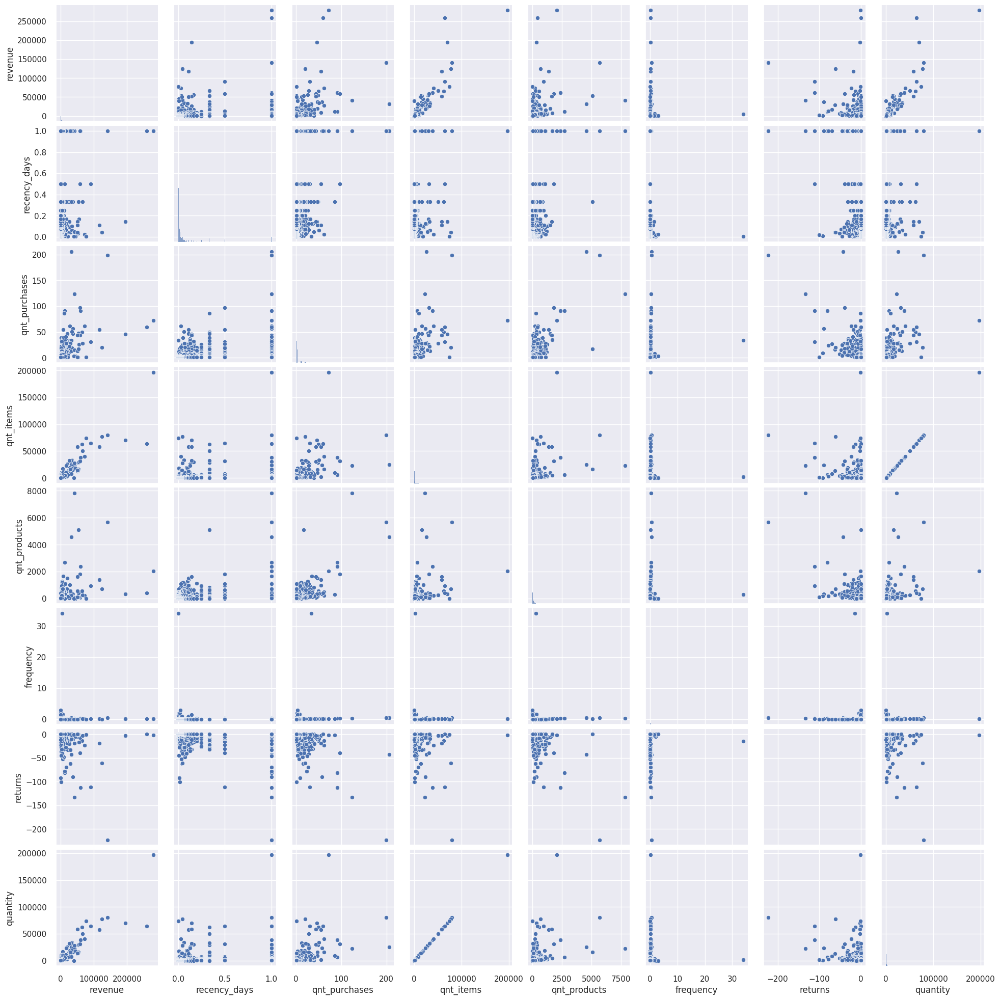

In [236]:
sns.pairplot(df42)

### 4.3 Estudo de Espaço

In [51]:
df4_selected = df4[cols_selected]
df4_no_scale = df4.drop( columns=['customer_id'], axis=1).copy()
df43 = df4_selected.drop( columns=['customer_id'], axis=1).copy()

In [52]:
df43.columns

Index(['gross_revenue', 'recency_days', 'qtde_products', 'frequency',
       'qtde_returns', 'revenue_returned'],
      dtype='object')

In [53]:
# Data encoding
mm = MinMaxScaler()
columns = ['gross_revenue', 'recency_days', 'qtde_products', 'frequency',
       'qtde_returns', 'revenue_returned']
df43[columns] = mm.fit_transform(df43[columns])

In [54]:
df43.head()

,gross_revenue,recency_days,qtde_products,frequency,qtde_returns,revenue_returned
0,0.019312,0.000014,0.037770,1.000000,0.025000,0.998671
1,0.011579,0.015217,0.021692,0.001344,0.028571,0.998141
2,0.024020,0.498656,0.029476,0.002058,0.020000,0.999015
3,0.003396,0.007866,0.003445,0.000733,0.000000,1.000000
4,0.003137,0.000323,0.000255,0.003984,0.045455,0.996879


In [55]:
X = df43.copy()

#### 4.3.1 PCA

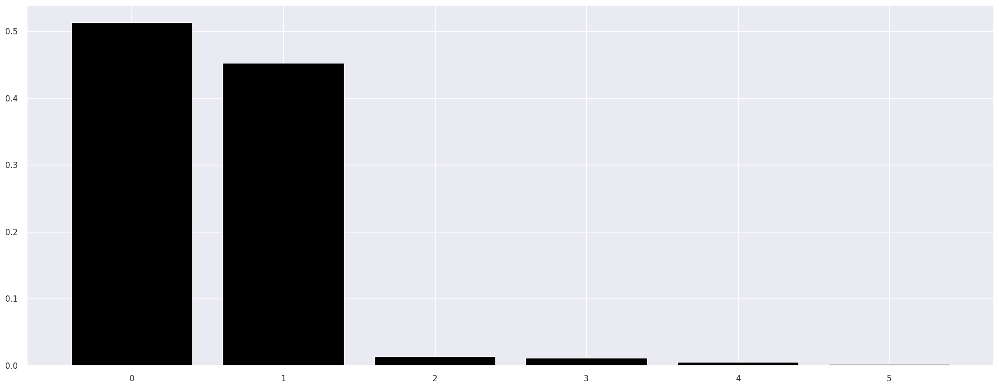

In [964]:
pca = dd.PCA( n_components = X.shape[1])

principal_components = pca.fit_transform( X )

# plot explained variable
features = range( pca.n_components_ )

plt.bar( features, pca.explained_variance_ratio_, color='black')

# pca component
df_pca = pd.DataFrame( principal_components )

<Axes: xlabel='0', ylabel='1'>

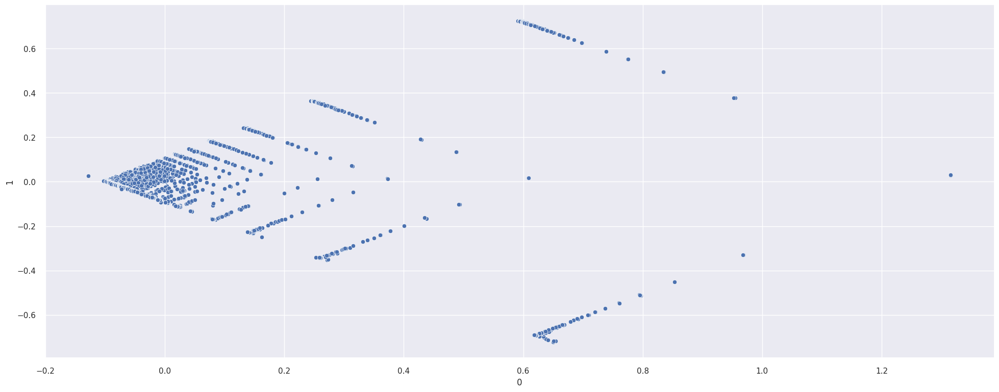

In [965]:
sns.scatterplot( x=0, y=1, data=df_pca)

#### 4.3.2 UMAP

/home/natan/miniconda3/envs/clusterenv/lib/python3.11/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


<Axes: xlabel='embedding_x', ylabel='embedding_y'>

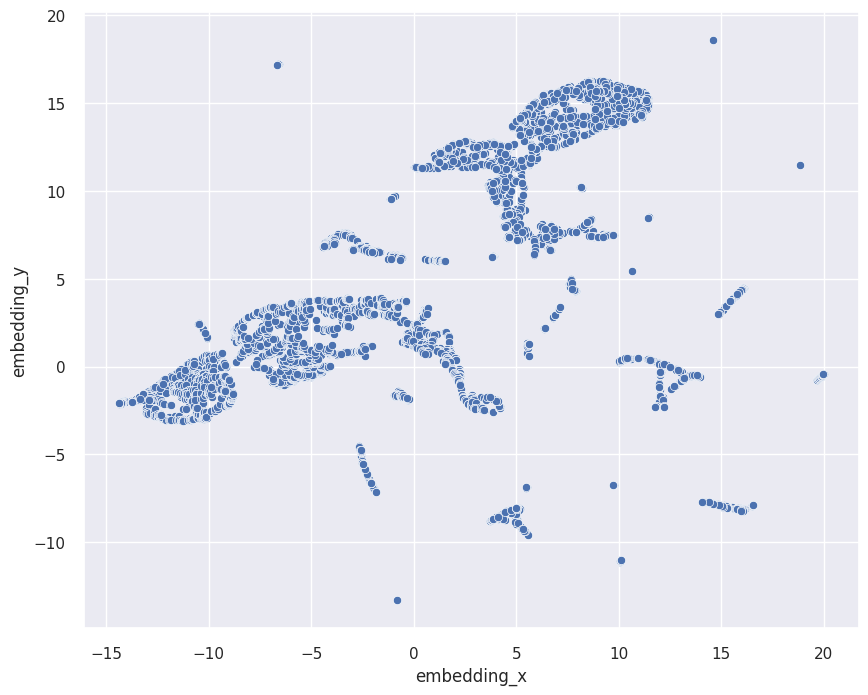

In [966]:
reducer = umap.UMAP( random_state=42 )
embedding = reducer.fit_transform( X )

# embedding
df_umap = pd.DataFrame()
df_umap['embedding_x'] = embedding[:, 0]
df_umap['embedding_y'] = embedding[:, 1]

# plot UMAP
plt.figure(figsize=(10,8))
sns.scatterplot(x='embedding_x', y='embedding_y', 
                data=df_umap)

#### 4.3.3 t-SNE

<Axes: xlabel='embedding_x', ylabel='embedding_y'>

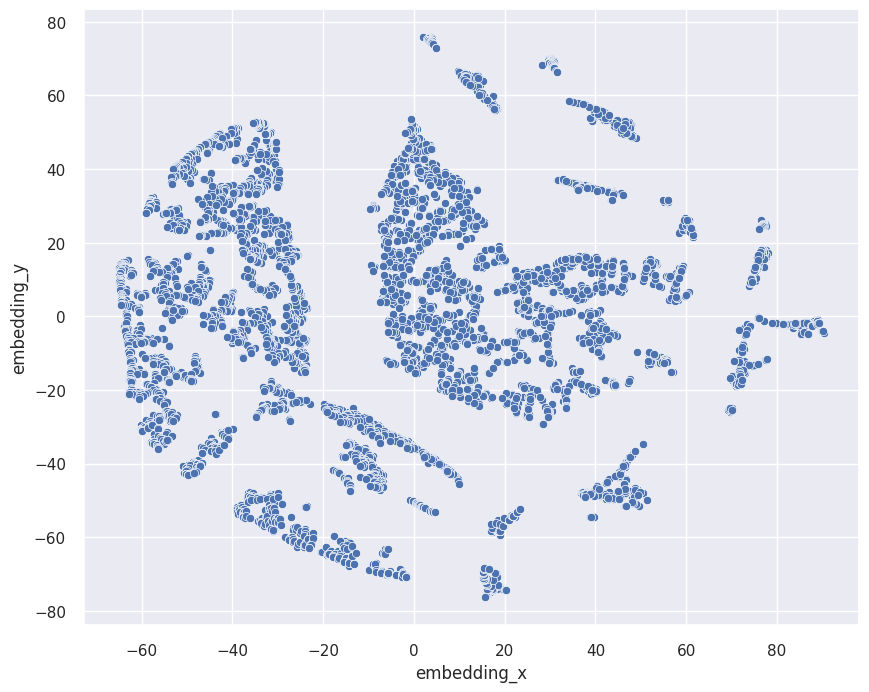

In [967]:
reducer = TSNE( n_components=2, 
                    n_jobs=-1,
                    random_state=42 )
embedding = reducer.fit_transform( X )

# embedding
df_tsne = pd.DataFrame()
df_tsne['embedding_x'] = embedding[:, 0]
df_tsne['embedding_y'] = embedding[:, 1]

# plot UMAP
plt.figure(figsize=(10,8))
sns.scatterplot(x='embedding_x', y='embedding_y', 
                data=df_tsne)

#### 4.4.4 Tree-Based Embedding

In [56]:
X = df4_no_scale.drop( columns=['gross_revenue'], axis=1 )
y = df4_no_scale['gross_revenue']

# model definition
rf = RandomForestRegressor( n_estimators=100,
                           criterion='friedman_mse',
                           random_state=42)
# model training
rf.fit(X, y)

# dataframe leaf
df_leaf = pd.DataFrame( rf.apply( X ) )

In [57]:
reducer = umap.UMAP( n_neighbors=20, random_state=42, n_components=3 )
embedding = reducer.fit_transform( df_leaf )

# embedding
df_tree = pd.DataFrame()
df_tree['embedding_x'] = embedding[:, 0]
df_tree['embedding_y'] = embedding[:, 1]
df_tree['embedding_z'] = embedding[:, 2]

# plot UMAP
# plt.figure(figsize=(10,8))
# sns.scatterplot(x='embedding_x', y='embedding_y', 
#                 data=df_tree)

/home/natan/miniconda3/envs/clusterenv/lib/python3.11/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


# 5.0 Data Preparation

In [58]:
df3 = df_ref.copy()

In [59]:
df_ref.columns

Index(['customer_id', 'gross_revenue', 'recency_days', 'qtde_invoices',
       'qtde_items', 'qtde_products', 'avg_ticket', 'avg_recency_days',
       'frequency', 'qtde_returns', 'avg_basket_size',
       'avg_unique_basket_size', 'revenue_returned'],
      dtype='object')

In [61]:
# standart scaler
mm = MinMaxScaler()

colunas = ['revenue', 'recency_days', 'purchases', 'avg_ticket',
       'returns', 'items', 'products_purchased', 'avg_basket_size',
       'avg_basket_unique', 'frequency', 'avg_recency_days']

df3[colunas] = mm.fit_transform(df3[colunas])
# # revenue
# df3['revenue'] = ss.fit_transform(df3[['revenue']])
# # recency_days
# df3['recency_days'] = ss.fit_transform(df3[['recency_days']])
# # purchases
# df3['purchases'] = ss.fit_transform(df3[['purchases']])
# # avg_ticket
# df3['avg_ticket'] = ss.fit_transform(df3[['avg_ticket']])
# # returns
# df3['returns'] = ss.fit_transform(df3[['returns']])
# # revenue
# df3['items'] = ss.fit_transform(df3[['items']])
# # revenue
# df3['products_purchased'] = ss.fit_transform(df3[['products_purchased']])
# # revenue
# df3['avg_basket_size'] = ss.fit_transform(df3[['avg_basket_size']])

KeyError: "['revenue', 'purchases', 'returns', 'items', 'products_purchased', 'avg_basket_unique'] not in index"

In [39]:
df3.head()

,customer_id,revenue,recency_days,purchases,avg_ticket,returns,items,products_purchased,avg_basket_size,avg_basket_unique,frequency,avg_recency_days
0,17850,0.019,0.995,0.161,0.000,0.001,0.009,0.038,0.001,0.000,1.000,0.000
1,13047,0.012,0.150,0.039,0.000,0.000,0.007,0.022,0.002,0.010,0.001,0.216
2,12583,0.024,0.005,0.068,0.000,0.001,0.026,0.029,0.005,0.007,0.001,0.133
3,13748,0.003,0.255,0.020,0.000,0.000,0.002,0.003,0.001,0.004,0.001,0.379
4,15100,0.003,0.893,0.010,0.004,0.000,0.000,0.000,0.000,0.000,0.002,0.071


# 6.0 Feature Selection

# 7.0 Hyperparameter Fine-Tunning

In [62]:
df7 = df_tree.copy()
X = df7.copy()

In [63]:
# cluster = [2, 3, 4, 9, 6, 7, 8, 9, 10]
cluster = np.arange(2, 20, 1)

### 7.1 K-Means

In [64]:
kmeans_list = []
for k in cluster:

    # model definition
    kmeans_model = KMeans( n_clusters=k, n_init=10)

    # model training
    kmeans_model.fit( X )

    # model predict
    labels = kmeans_model.predict( X )

    # model performance
    sil = metrics.silhouette_score(X, labels, metric='euclidean')
    kmeans_list.append( sil )

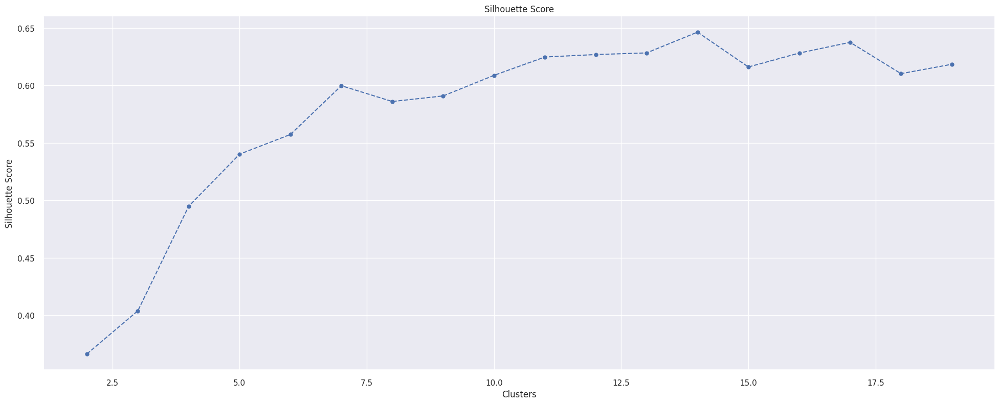

In [65]:
plt.plot(cluster, kmeans_list, linestyle='--', marker='o', color='b');
plt.xlabel( 'Clusters' );
plt.ylabel( 'Silhouette Score' );
plt.title( 'Silhouette Score' );

### 7.2 GMM

In [66]:
gmm_list = []
for k in cluster:

    # model definition
    gmm_model = GaussianMixture( n_components=k, random_state=42, n_init=10, init_params='kmeans', max_iter=300 )

    # model training
    gmm_model.fit( X )

    # model prediction
    labels = gmm_model.predict( X )

    # model performance
    sil = metrics.silhouette_score( X, labels, metric= 'euclidean')
    
    gmm_list.append( sil )
   

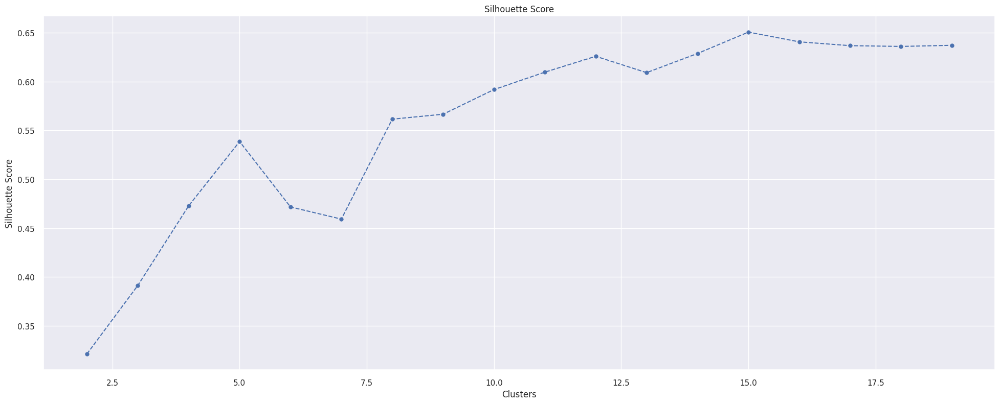

In [67]:
plt.plot(cluster, gmm_list, linestyle='--', marker='o', color='b');
plt.xlabel('Clusters');
plt.ylabel('Silhouette Score');
plt.title('Silhouette Score');

### 7.3 Hierarchical Clustering

In [68]:
hc_list = []
for k in cluster:
    # model definition
    hc_model = hc.linkage( X, 'ward' )
    # model predict
    labels = hc.fcluster( hc_model, k, criterion='maxclust' )
    # metrics
    sil = metrics.silhouette_score( X, labels, metric='euclidean' )
    hc_list.append( sil )


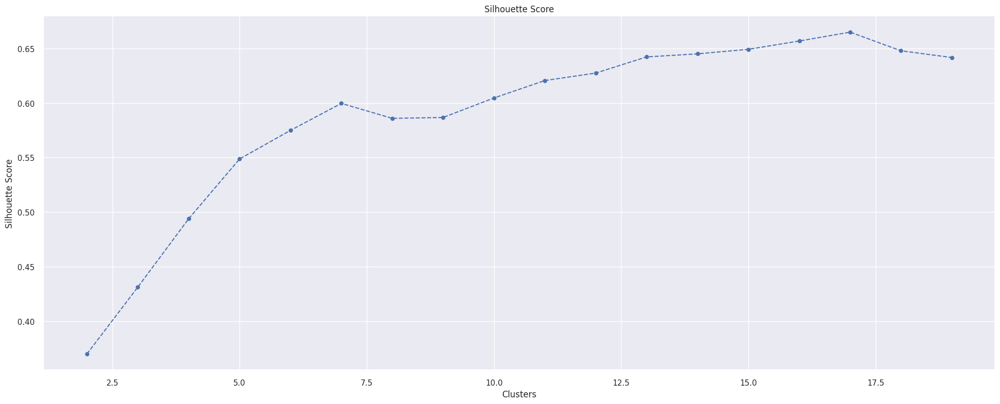

In [69]:
plt.plot(cluster, hc_list, linestyle='--', marker='o', color='b');
plt.xlabel('Clusters');
plt.ylabel('Silhouette Score');
plt.title('Silhouette Score');

### 7.4 DBSCAN

In [70]:
eps=2.0
min_samples=4

# model definition
dbscan_model = DBSCAN(eps=eps, min_samples=min_samples)
# model traning and predict
labels = dbscan_model.fit_predict( X )

sil = metrics.silhouette_score( X, labels, metric='euclidean')

In [71]:
sil

0.5461439

In [72]:
np.unique(labels)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17])

### 7.5 Affinity Propagation

In [88]:
df4.head()

,customer_id,gross_revenue,recency_days,qtde_invoices,qtde_items,qtde_products,avg_ticket,avg_recency_days,frequency,qtde_returns,avg_basket_size,avg_unique_basket_size,revenue_returned
0,17850,5391.21,0.002695,34,1733,297,18.152222,-0.971014,17.000000,0.025000,50.970588,0.617647,-102.58
1,13047,3232.59,0.017857,9,1390,171,18.904035,-0.269425,0.028302,0.028571,154.444444,11.666667,-143.49
2,12583,6705.38,0.500000,15,5028,232,28.902500,-0.183075,0.040431,0.020000,335.200000,7.600000,-76.04
3,13748,948.25,0.010526,5,439,28,33.866071,-0.271664,0.017921,0.000000,87.800000,4.800000,0.00
4,15100,876.00,0.003003,3,80,3,292.000000,-0.444444,0.073171,0.045455,26.666667,0.333333,-240.90


In [89]:
X = df4.drop(columns=['customer_id'], axis=1).copy()

In [90]:
# model definition
ap = AffinityPropagation(preference=-50)

# model training
ap.fit( X )

# predict
labels = ap.predict( X )

/home/natan/miniconda3/envs/clusterenv/lib/python3.11/site-packages/sklearn/cluster/_affinity_propagation.py:142: ConvergenceWarning:

Affinity propagation did not converge, this model may return degenerate cluster centers and labels.



In [91]:
X['cluster'] = labels

In [94]:
X['lables'].unique()

array([   0,    1,    2, ..., 5010, 5011, 5012])

In [93]:
# 3 clusters and without avg ticket
fig = px.scatter_3d(X, x='embedding_x', y='embedding_y', z='embedding_z', color='lables')
fig.show()

ValueError: Value of 'x' is not the name of a column in 'data_frame'. Expected one of ['gross_revenue', 'recency_days', 'qtde_invoices', 'qtde_items', 'qtde_products', 'avg_ticket', 'avg_recency_days', 'frequency', 'qtde_returns', 'avg_basket_size', 'avg_unique_basket_size', 'revenue_returned', 'lables'] but received: embedding_x

InvalidIndexError: (slice(None, None, None), 0)

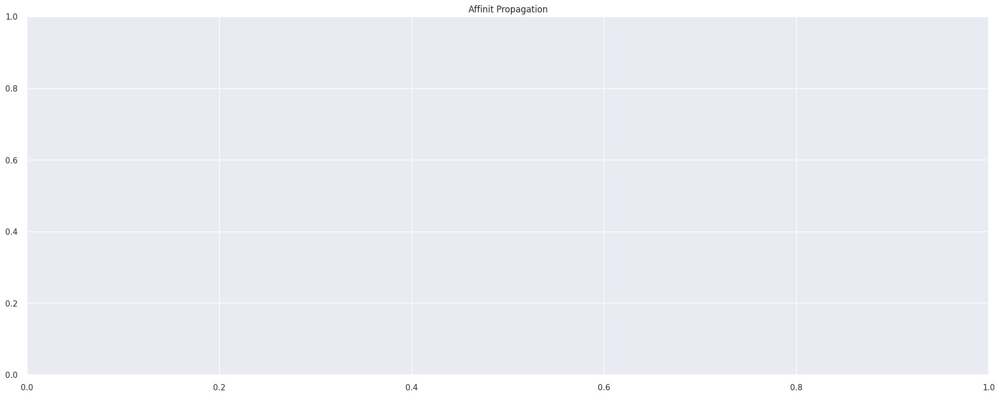

In [82]:
fig = plt.figure()
plt.title( 'Affinit Propagation' )
plt.scatter(X[:, 0], X[:, 1], c=labels, cmap='rainbow', alpha=0.7, edgecolors='b')
plt.show()

### 7.9 Results

In [1119]:
df_results = pd.DataFrame({'KMeans':kmeans_list, 'GMM': gmm_list, 'HC': hc_list}).T
df_results.columns = cluster

In [1120]:
df_results.style.highlight_max(color='lightgreen', axis=1)

,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
KMeans,0.366290,0.403799,0.494836,0.548144,0.574971,0.599714,0.585972,0.590811,0.608710,0.624693,0.629951,0.628268,0.616548,0.621061,0.632807,0.592632,0.649226,0.600634
GMM,0.321264,0.391362,0.472943,0.538662,0.471707,0.459264,0.561578,0.566642,0.591879,0.609709,0.625945,0.609206,0.628810,0.650694,0.640739,0.636834,0.636040,0.637196
HC,0.369875,0.431176,0.493916,0.548730,0.574971,0.599714,0.585972,0.586788,0.604687,0.620670,0.627530,0.642355,0.645148,0.649333,0.656936,0.665092,0.647948,0.641787


### Within-Cluster Sum of Squares (WSS)

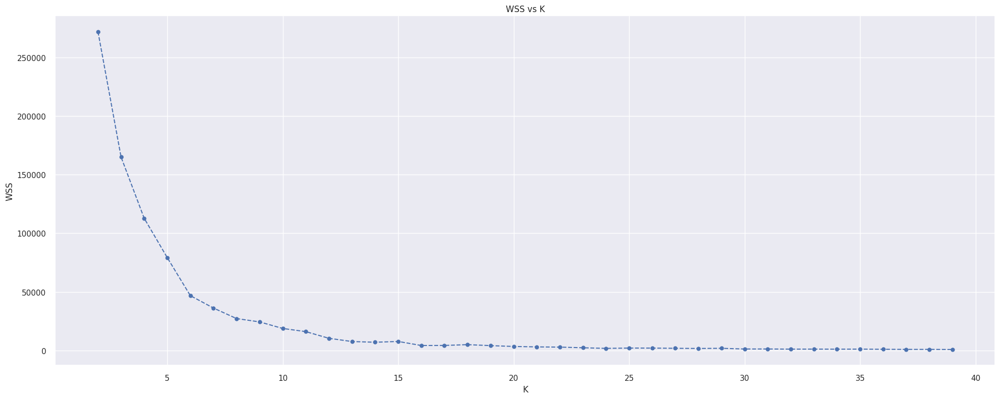

In [54]:
wss = []
for k in cluster:
    # model definition
    kmeans = KMeans(init='random', n_clusters=k, n_init=10,  max_iter=300, random_state=42)

    # model training
    kmeans.fit( X )

    #validation
    wss.append(kmeans.inertia_)

# plot wss - Elbow Method
plt.plot(cluster, wss, linestyle='--', marker='o');
plt.xlabel( 'K' );
plt.ylabel( 'WSS' );
plt.title('WSS vs K');
plt.show()

### Silhouette Score

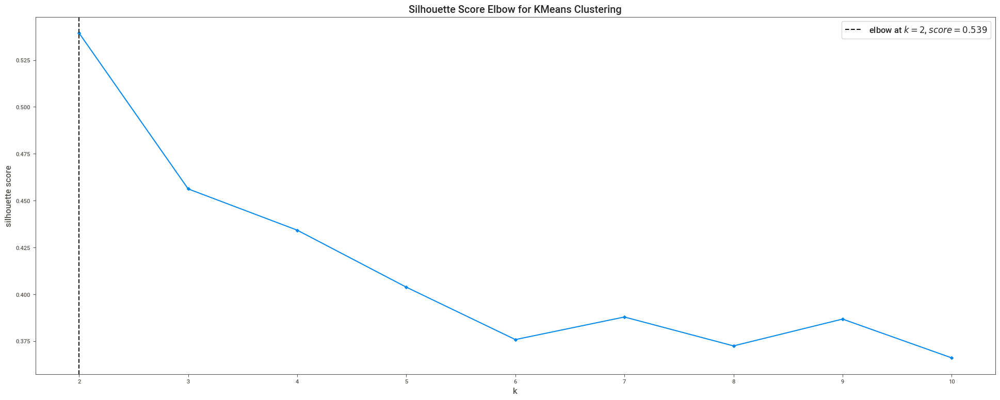

In [73]:
kmenas = KElbowVisualizer( KMeans(n_init=10), k=cluster, metric='silhouette', timings=False);
kmenas.fit( X );
kmenas.show();

### Silhouette Analysis

IndexError: index 5 is out of bounds for axis 0 with size 5

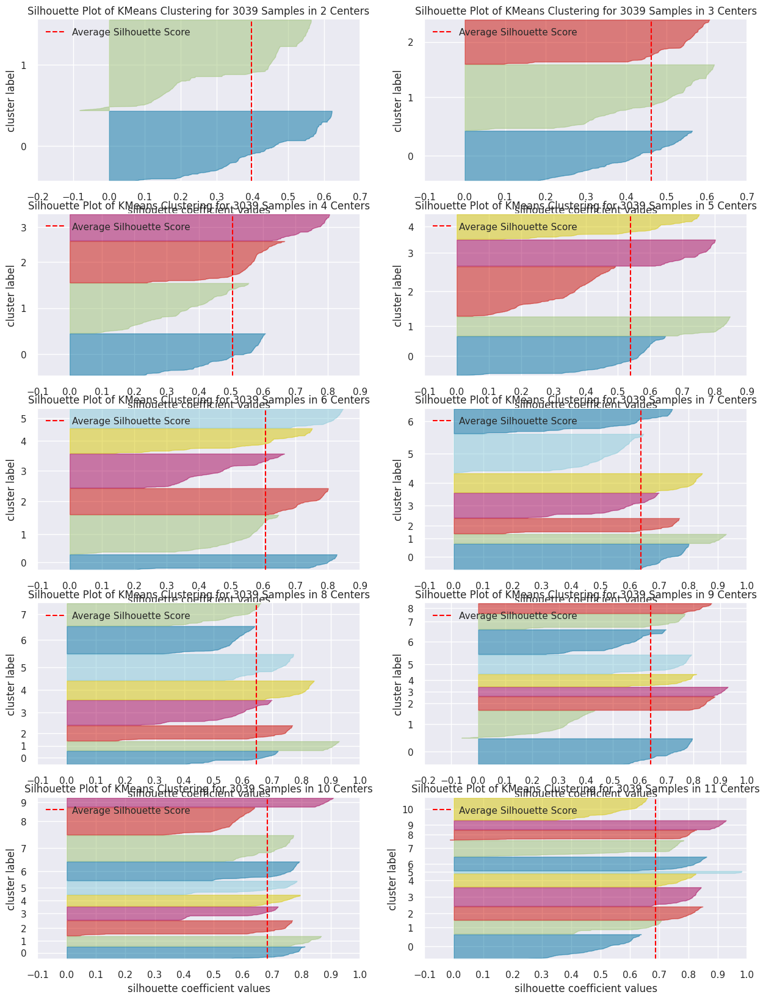

In [57]:
fig, ax = plt.subplots(9, 2, figsize=(19,20))

for k in cluster:
    km = KMeans(n_clusters=k, init='random', n_init=10, max_iter=100, random_state=42)
    q, mod = divmod( k - 2, 2)

    viz = SilhouetteVisualizer( km, colors='yellowbrick', ax=ax[q][mod])
    viz.fit( X )
    viz.finalize()

plt.tight_layout()
plt.show()

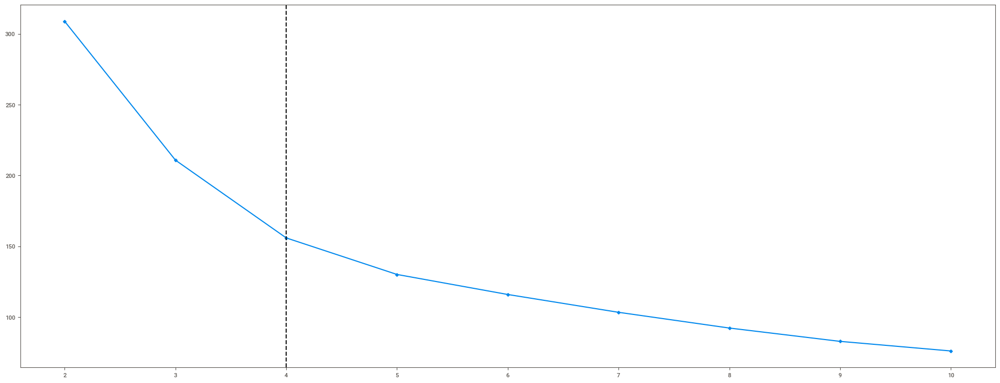

In [72]:
# yellowbrick library
kmeans = KElbowVisualizer( KMeans(n_init=10), k=cluster, timings=False)
kmeans.fit( X );
# kmeans.show();

In [ ]:
# model definition

# model training 

# model predict

# model performance

# 8.0 Machine Learnign Modeling

In [1121]:
k = 11

In [1122]:
# model definition
kmeans = KMeans(n_clusters=k, n_init=10, random_state=42)

# model trainig 
kmeans.fit ( X )

# clustering
labels = kmeans.labels_

In [799]:
# # model definition
# gmm_model = GaussianMixture( n_components=k, random_state=42 )

# # model training
# gmm_model.fit( X )

# # model prediction
# labels = gmm_model.predict( X )

In [800]:
# # model definition
# hc_model = hc.linkage( X, 'ward' )

# # model predict
# labels = hc.fcluster( hc_model, k, criterion='maxclust' )


### Cluster Validation

In [1123]:
# WSS 
print( f'WSS value: {kmeans.inertia_}')

# Silhouette
print(f'SS Value: {metrics.silhouette_score( X, labels, metric="euclidean")}')

WSS value: 34674.62890625


SS Value: 0.6244341135025024


# 9.0 Cluster Analysis

In [1124]:
df9 = X.copy()
df9['cluster'] = labels

In [1125]:
df9.head()

,embedding_x,embedding_y,embedding_z,cluster
0,13.578561,0.600368,0.107602,5
1,12.681374,0.756145,-1.361616,5
2,11.271934,1.357019,11.035937,0
3,4.621651,15.056544,1.158700,9
4,-3.461715,7.839437,10.122209,1


In [1127]:
# 3 clusters and without avg ticket
fig = px.scatter_3d(df9, x='embedding_x', y='embedding_y', z='embedding_z', color='cluster')
fig.show()

In [1128]:
# sns.scatterplot(x='embedding_x', y='embedding_y', hue='cluster', palette='deep', data=df9)

### 2D Plot

FloatingPointError: underflow encountered in multiply

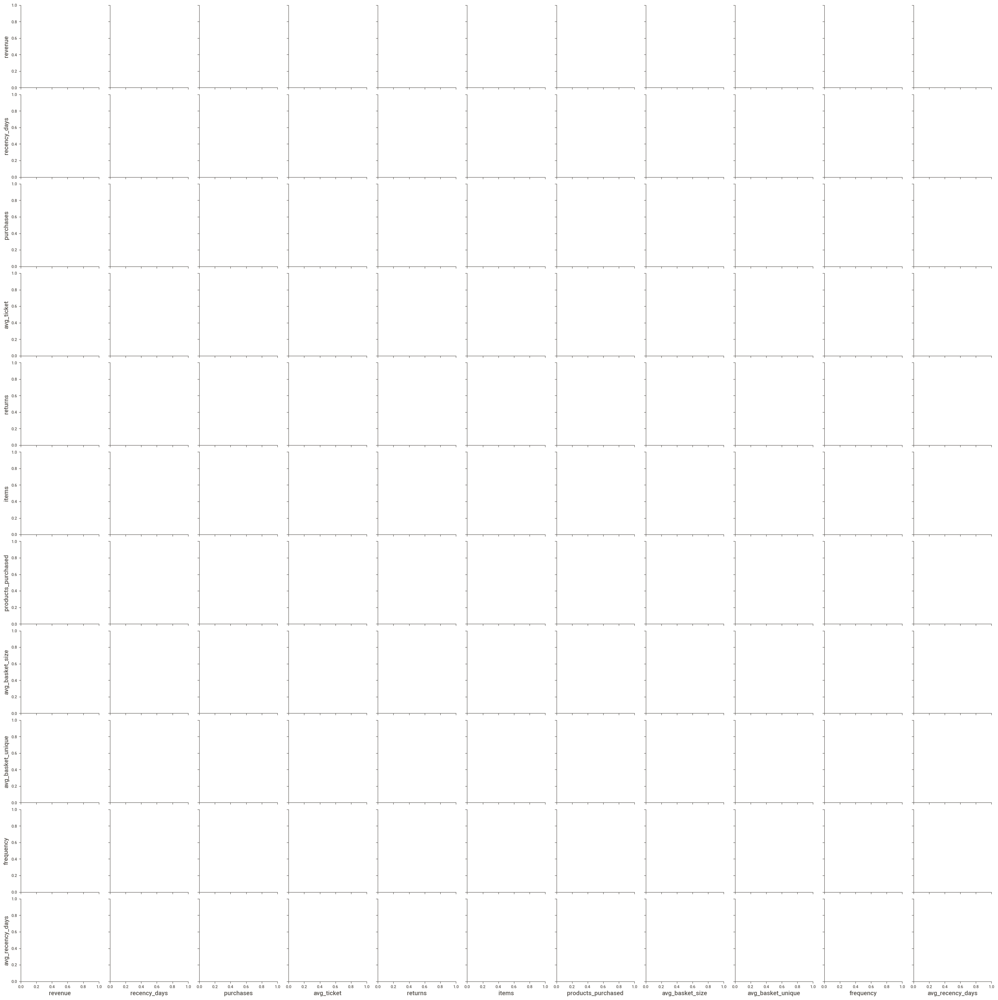

In [46]:
df_viz = df9.drop(columns='customer_id', axis=1)
sns.pairplot(df_viz, hue='cluster')

### Visualization Inspection

In [54]:
df3.head()

,customer_id,revenue,recency_days,purchases,avg_ticket,returns,items,products_purchased,avg_basket_size,avg_basket_unique,frequency,avg_recency_days
0,17850,0.454,2.282,4.482,-0.028,-0.004,0.171,0.971,-0.181,-0.406,74.094,-0.698
1,13047,0.181,-0.541,0.812,-0.028,-0.007,0.093,0.373,-0.094,-0.272,0.001,0.493
2,12583,0.621,-1.025,1.692,-0.020,0.003,0.916,0.662,0.056,-0.318,0.027,0.036
3,13748,-0.108,-0.191,0.224,-0.016,-0.031,-0.122,-0.307,-0.150,-0.446,-0.022,1.396
4,15100,-0.117,1.941,-0.069,0.185,-0.016,-0.203,-0.426,-0.201,-0.506,0.102,-0.305


In [ ]:
# 3 clusters and without avg ticket
fig = px.scatter_3d(df3, x='recency_days', y='frequency', z='revenue', color='cluster')
fig.show()

/home/natan/miniconda3/envs/clusterenv/lib/python3.11/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


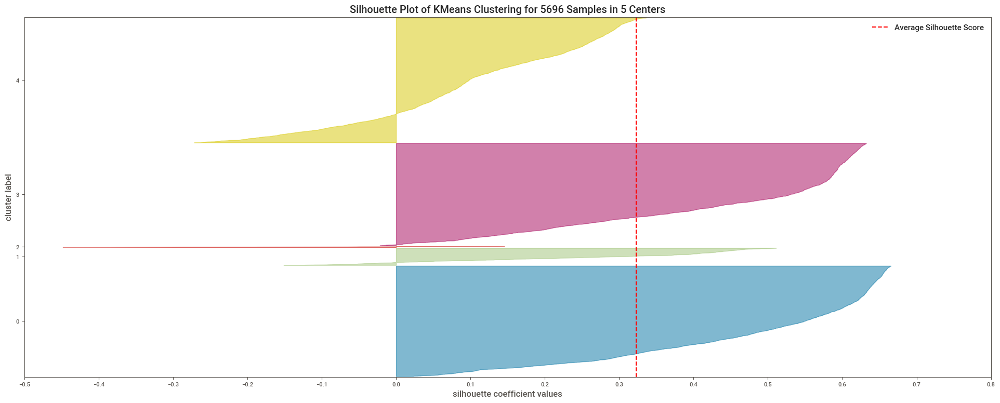

In [47]:
# 4 Clusters with avg ticket
viz = SilhouetteVisualizer( kmeans, colors='yellowbrick')
viz.fit( X )
viz.finalize()

### UMAP - t-SNE (Manifold)

In [169]:
reducer = umap.UMAP( n_neighbors= 40, random_state=42 )
embedding = reducer.fit_transform( X )

# embedding
df_viz['embedding_x'] = embedding[:, 0]
df_viz['embedding_y'] = embedding[:, 1]

# plot UMAP
plt.figure(figsize=(10,8))
sns.scatterplot(x='embedding_x', y='embedding_y', 
                data=df_viz, 
                hue='cluster', 
                palette=sns.color_palette( 'hls', n_colors=len(df_viz['cluster'].unique())))

/home/natan/miniconda3/envs/clusterenv/lib/python3.11/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


KeyError: 'cluster'

<Figure size 1000x800 with 0 Axes>

### Cluster Profile

In [1129]:
df4['cluster'] = labels
df9 = df4.copy()

In [1130]:
df4.head()

,customer_id,gross_revenue,recency_days,qtde_invoices,qtde_items,qtde_products,avg_ticket,avg_recency_days,frequency,qtde_returns,avg_basket_size,avg_unique_basket_size,revenue_returned,cluster
0,17850,5391.21,0.002695,34,1733,297,18.152222,-0.971014,17.000000,0.025000,50.970588,0.617647,-102.58,5
1,13047,3232.59,0.017857,9,1390,171,18.904035,-0.269425,0.028302,0.028571,154.444444,11.666667,-143.49,5
2,12583,6705.38,0.500000,15,5028,232,28.902500,-0.183075,0.040431,0.020000,335.200000,7.600000,-76.04,0
3,13748,948.25,0.010526,5,439,28,33.866071,-0.271664,0.017921,0.000000,87.800000,4.800000,0.00,9
4,15100,876.00,0.003003,3,80,3,292.000000,-0.444444,0.073171,0.045455,26.666667,0.333333,-240.90,1


In [1131]:
df9['recency_days'] = df9['recency_days'].apply( lambda x: 1/ x if x != 0 else 0)
df9['qtde_returns'] = df9['qtde_returns'].apply( lambda x: 1/ x if x != 0 else 0)
df9['avg_recency_days'] = df9['avg_recency_days'].apply( lambda x: 1/ x if x != 0 else 1)

In [1132]:
# Number of customers
df_cluster = df9[['customer_id', 'cluster']].groupby('cluster').count().reset_index()
df_cluster['per_customer'] = 100 * df_cluster['customer_id'] / df_cluster['customer_id'].sum()

# Avg revenue
df_avg_revenue = df9[['gross_revenue', 'cluster']].groupby('cluster').mean().reset_index()
df_cluster = pd.merge(df_cluster, df_avg_revenue, on='cluster', how='inner')

# Avg recency
df_avg_recency = df9[['recency_days', 'cluster']].groupby('cluster').mean().reset_index()
df_cluster = pd.merge(df_cluster, df_avg_recency, on='cluster', how='inner')

# purchases
df_avg_frequency = df9[['qtde_invoices', 'cluster']].groupby('cluster').mean().reset_index()
df_cluster = pd.merge(df_cluster, df_avg_frequency, on='cluster', how='inner')

# # Avg Ticket
# df_avg_ticket = df9[['revenue', 'cluster']].groupby('cluster').mean().reset_index()
# df_cluster = pd.merge(df_cluster, df_avg_ticket, on='cluster', how='inner')

# returns
df_avg_ticket = df9[['qtde_returns', 'cluster']].groupby('cluster').mean().reset_index()
df_cluster = pd.merge(df_cluster, df_avg_ticket, on='cluster', how='inner')

# product_quantity
df_avg_ticket = df9[['qtde_products', 'cluster']].groupby('cluster').mean().reset_index()
df_cluster = pd.merge(df_cluster, df_avg_ticket, on='cluster', how='inner')

# avg_frquency
df_avg_ticket = df9[['frequency', 'cluster']].groupby('cluster').mean().reset_index()
df_cluster = pd.merge(df_cluster, df_avg_ticket, on='cluster', how='inner')

# quantity
df_avg_ticket = df9[['avg_basket_size', 'cluster']].groupby('cluster').mean().reset_index()
df_cluster = pd.merge(df_cluster, df_avg_ticket, on='cluster', how='inner')

# AVG revenue returned
df_avg_money_returned = df9.groupby('cluster')['revenue_returned'].mean().reset_index()
df_cluster = pd.merge(df_cluster, df_avg_money_returned, on='cluster', how='inner')

In [1133]:
df_cluster.sort_values('gross_revenue', ascending=False)

,cluster,customer_id,per_customer,gross_revenue,recency_days,qtde_invoices,qtde_returns,qtde_products,frequency,avg_basket_size,revenue_returned
0,0,493,8.656716,11075.384199,30.144016,14.811359,297.584178,354.436105,0.126647,822.425366,-465.533895
5,5,533,9.359087,2884.956210,73.388368,5.022514,18.035647,212.742964,0.353365,556.521769,-35.583508
7,7,727,12.765584,1576.121733,56.716644,4.412655,14.579092,100.455296,0.163218,295.073072,-33.048776
2,2,208,3.652327,1492.949279,162.004808,1.043269,0.649038,165.158654,0.983023,422.480769,-0.421635
4,4,396,6.953468,1118.087904,104.368687,2.595960,9.676768,98.833333,0.457416,287.428344,-20.240707
9,9,417,7.322212,872.648129,87.182254,2.733813,5.038369,53.784173,0.288559,213.504077,-14.732326
6,6,376,6.602283,548.072021,97.321809,2.210106,3.678191,42.821809,0.426589,186.620966,-10.138697
10,10,794,13.942054,442.860227,136.267003,1.714106,2.068010,41.696474,0.650830,128.424160,-7.282380
1,1,822,14.433714,259.274185,162.371046,1.238443,1.709246,16.588808,0.828490,108.228994,-5.005401
8,8,420,7.374890,149.508143,186.366667,1.123810,0.845238,13.578571,0.956112,37.346769,-3.009095


In [65]:
df_cluster.sort_values('gross_revenue', ascending=False)

,cluster,customer_id,per_customer,gross_revenue,recency_days,qtde_invoices,qtde_returns,qtde_products,frequency,avg_basket_size
4,4,295,9.707141,15309.079051,23.227119,19.098305,-475.505085,431.857627,0.114944,859.116639
6,6,176,5.791379,3900.387727,26.642045,9.352273,-36.562500,229.409091,0.037093,351.541459
2,2,366,12.043435,2598.247732,40.775956,6.691257,-22.737705,161.262295,0.096338,321.597022
9,9,193,6.350773,1908.788187,39.932642,5.238342,-28.181347,113.010363,0.054787,284.201521
3,3,238,7.831524,1660.996303,32.302521,7.092437,-17.235294,124.747899,0.031218,120.620926
0,0,478,15.728858,1199.403975,67.506276,2.884937,-13.027197,75.202929,0.114296,271.026151
7,7,260,8.555446,856.230615,74.600000,3.192308,-6.923077,65.388462,0.151094,176.123526
5,5,270,8.884501,653.102778,82.085185,2.729630,-3.851852,54.540741,0.155058,144.936049
8,8,261,8.588351,514.479234,93.812261,2.567050,-6.839080,43.862069,0.233328,119.393199
1,1,502,16.518592,328.410120,120.135458,2.123506,-5.276892,22.511952,0.386004,69.869259


# 10.0 EDA

### 10.1 MindMap de Hipoteses

### 10.2 Hipóteses de Negócio

1. Afirmação
2. Comparação entre variáveis
4. Valor base de comparação

### Hipóteses de Compra

1. Os clientes do cluster insiders usam cartão de crédito em 80% das compras.
2. **Os clientes do cluster insiders possuem um ticket médio de 10% acima do cluster More Products**
**3. Os clientes do cluster insiders possuem um basket size acima de 9 produtos**
4. **Os clientes do cluster insiders possuem um volume (produtos) de compras acima de 10% do total de compras**
9. **Os clientes do cluster insiders possuem um volume (faturamento) de compras acima de 10% do total de compras**
6. **Os clientes do cluster insiders tem um número de devolução abaixo da média da base total de clientes**
7. **A mediana do faturamento pelos clientes do cluster insider é 10% maior do que a mediana do faturamento geral.**
8. **O percentil do gmv pelos clientes insiders.**

#### H1: Os clientes do cluster insiders possuem um volume de compra 10% cima do total
- True
    - Cluster Insiders representa 52.7% do volume de compras

In [365]:
insiders_purchase = df9.loc[df9['cluster']==4, 'qtde_products'].sum()
all_purchase = df9.loc[df9['cluster']!=4, 'qtde_products'].sum()

In [366]:
print(f'% of insider purchases {100*(insiders_purchase/all_purchase)}')

% of insider purchases 52.79170568783616


In [88]:
print(insiders_purchase)
print(all_purchase)

127398
241322


#### H2. **Os clientes do cluster insiders possuem um volume (faturamento) de compras acima de 10% do total de compras**
- True
    - Cluster Insiders representa 55,15% do faturamento


In [367]:
insiders_income = df9.loc[df9['cluster']==4, 'gross_revenue'].sum()
all_income = df9['gross_revenue'].sum()
print(f'% of insider income {100*(insiders_income/all_income)}')

% of insider income 55.15112947446917


In [353]:
print(insiders_income)
print(all_income)

2761615.6
8188732.24


#### H3. **Os clientes do cluster insiders tem um número de devolução médio abaixo da média da base total de clientes**
- False


In [354]:
insider_return = -1*(df9.loc[df9['cluster']==9, 'qtde_returns'].mean())
all_return = -1*(df9.loc[df9['cluster']!=9, 'qtde_returns'].mean())
print(f'Avg Return Insiders: {np.round(insider_return, 0)}')
print(f'Avg Return All: {np.round(all_return, 0)}')

Avg Return Insiders: 411.0
Avg Return All: 20.0


#### H4. **A mediana do faturamento pelos clientes do cluster insider é 10% maior do que a  mediana do faturamento geral.**
- True


In [368]:
insiders_revenue = df9.loc[df9['cluster']==4, 'gross_revenue'].median()
all_revenue = df9.loc[:, 'gross_revenue'].median()
dif_median = (insiders_revenue - all_revenue) / all_revenue
print('Median Diff: {:.2f}%'.format(100*dif_median))

Median Diff: 560.76%


#### H9. **A GMV dos clientes insiders esta concentrados no 3 quartil**


### Hipótese Cliente

1. 60% dos clientes do cluster insiders possuem o estado civil de solteiro.
2. 10% dos clientes do cluster insiders estão na faixa de 24-39 anos.
3. 40% das localidades de entrega do cluster insiders estão dentro de um raio de 90km.
4.  9% dos clientes do cluster insiders recebem mais de 100 mil dólares anualmente.
9. 90% dos clientes do cluster insiders tem ensino superior completo.

### Hipótese Produto

1. 30% de todos os produtos em pacotes grandes são comprados pelos clientes do cluster insiders.
2. A mediana dos preços dos produtos comprados pelos clientes do cluster insider é 10% maior do que a mediana de todos os preços dos produtos.
3. O percentil do preço dos produtos comprados pelos clientes insiders.
4. O peso médio dos produtos comprados pelos clientes do cluster insiders é maior do que o peso médio dos outros clusters.
9. A idade média dos produtos comprados pelos clientes do cluster insiders é menor do que 19 dias.

### Perguntas de Negócio

1. Quem são as pessoas elegíveis para participar do programa Insiders?
2. Quantos clientes farão parte do grupo?
3. Quais as principais características destes clientes?
4. Qual a porcentagem de contribuição do faturamento, vinda dos Insiders?
9. Qual a expectativa de faturamento desse grupo para os próximos meses?
6. Quais as condições para uma pessoa participar do grupo?
7. Quais as condições para uma pessoas ser removida do grupo?
8. Qual a garantia que o programa é melhor que o restante da base?
9. Quais ações o time de marketing pode realizar para aumentar o faturamento?

#### **1. Quem são as pessoas elegíveis para participar do programa de Insiders ?**

In [68]:
df9.loc[df9['cluster'] == 4, 'customer_id'].head()

2     12583
6     14688
8     15311
12    16029
14    12431
Name: customer_id, dtype: int64

#### **2. Quantos clientes farão parte do grupo?**

In [69]:
df9.loc[df9['cluster'] == 4, 'customer_id'].size

295

#### **3. Quais as principais características desses clientes ?**

- Cluster 4: (Insider)
- Nº Customers: 295 (9.7%)
- Avg Recency: 23 days
- Avg Revenue: $15309,00
- Avg Frequency: 0.11/day
- Avg Purchases: 19
- Avg Qtd of products: 431

#### **4. Qual a porcentagem de contribuição do faturamento, vinda do Insiders ?**

In [73]:
df_insiders_gmv = df9.loc[df9['cluster'] == 4, 'gross_revenue'].sum()
df_all_gmv = df9.loc[:, 'gross_revenue'].sum()

print( '% GMV from Insiders: {:.2f}'.format( 100*(df_insiders_gmv / df_all_gmv )) )

% GMV from Insiders: 55.15


#### **5. Qual a expectativa de faturamento desse grupo para os próximos meses ?**

#### **6. Quais as condições para uma pessoa ser elegível ao Insiders ?**

#### **7. Quais as condições para uma pessoa ser removida do Insiders ?**

#### **8. Qual a garantia que o programa Insiders é melhor que o restante da base ?**

#### **9. Quais ações o time de marketing pode realizar para aumentar o faturamento?**

### 10.3 Priorização das Hipóteses

### 10.4 Validação

### 10.9 Quadro de respostas